# **Dependencies**

In [1]:
!pip install osmnx momepy
!apt-get install -qq libgdal-dev libproj-dev
!pip install gdal #needed to run ox.elevation.add_node_elevations_raster()
!pip install rasterio  #needed to run ox.elevation.add_node_elevations_raster()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.2/107.2 kB 2.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.8/277.8 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 54.5 MB/s eta 0:00:00


In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import osmnx as ox
import networkx as nx
import geopandas as gpd
import momepy #easily convert gdf to nx graphs
import rasterio #import geotiff elevation data
import json
import rasterio.features
import rasterio.warp

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#**100 Year Flooding**

## Data

In [4]:
# File paths
byggnader_ds = '/content/drive/MyDrive/GraphML_G05/Dataset/Byggnader_Stockholm/dataset.geojson'
shoreline_ds = '/content/drive/MyDrive/GraphML_G05/Dataset/Shoreline_Stockholm/dataset.geojson'
rain_ds = '/content/drive/MyDrive/GraphML_G05/Dataset/Terrain_Buildings_Stockholm_Extent_polygons_Rain=10_0_cm/0.geojson'


# Load GeoDataFrames
byggnader_gdf = gpd.read_file(byggnader_ds) # read dataset
byggnader_gdf = byggnader_gdf.explode(index_parts=True) # takes each MultiPolygon geometry and breaks it down into its individual component polygons

shoreline_gdf = gpd.read_file(shoreline_ds)
shoreline_gdf = shoreline_gdf.explode(index_parts=True)

rain_gdf = gpd.read_file(rain_ds)
rain_gdf = rain_gdf.explode(index_parts=True)

# Create graph from bounding box got from database
bbox_edges = [59.3460, 59.3077, 18.1257, 18.0268]  # Top, Bot, Right, Left
G = ox.graph.graph_from_bbox(*bbox_edges, network_type='drive') #other network types: drive, bike, drive_service, all, all_private


nodes, edges = ox.graph_to_gdfs(G) # converts the graph G into two GeoDataFrames

print(len(nodes))
print(len(edges))

# Get the CRS of the dataset
gdf_crs = byggnader_gdf.crs
print(gdf_crs)

# Get the CRS of the graph
osm_crs = G.graph["crs"] # get the crs value form the graph dict, epsg:4326 by default are represented as latitude and longitude
print(osm_crs)

# Project edge and node into gdf_crs
edges = ox.project_gdf(edges, to_crs=gdf_crs, to_latlong=False)
nodes = ox.project_gdf(nodes, to_crs=gdf_crs, to_latlong=False)


<ipython-input-4-14f0b1a22810>:19: FutureWarning: The `north`, `south`, `east`, and `west` parameters are deprecated and will be removed in the v2.0.0 release. Use the `bbox` parameter instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  G = ox.graph.graph_from_bbox(*bbox_edges, network_type='drive') #other network types: drive, bike, drive_service, all, all_private


2126
4324
EPSG:3006
epsg:4326


In [5]:
print(edges) # The edge is linestring that can have more than 2 nodes

                                                       osmid  \
u           v          key                                     
119024      21651762   0    [35022832, 250434555, 533215515]   
            34586358   0                [5083148, 178313471]   
            35123521   0                   [1300, 660569359]   
119039      1886783086 0              [749079348, 749079351]   
            1221343891 0                           749079352   
...                                                      ...   
11830115094 161025     0                          1286532782   
            271875516  0                            24225422   
11886258547 533720     0            [1280522018, 1280522019]   
11895745719 2880735099 0                             8178434   
            271875516  0              [163860787, 177560558]   

                                              name        highway maxspeed  \
u           v          key                                                   
119024     

In [6]:
# Add numeric_index attribute to edge
edge_indices = edges['numeric_index'] = np.arange(len(edges))
print(edges['numeric_index'] )

u            v           key
119024       21651762    0         0
             34586358    0         1
             35123521    0         2
119039       1886783086  0         3
             1221343891  0         4
                                ... 
11830115094  161025      0      4319
             271875516   0      4320
11886258547  533720      0      4321
11895745719  2880735099  0      4322
             271875516   0      4323
Name: numeric_index, Length: 4324, dtype: int64


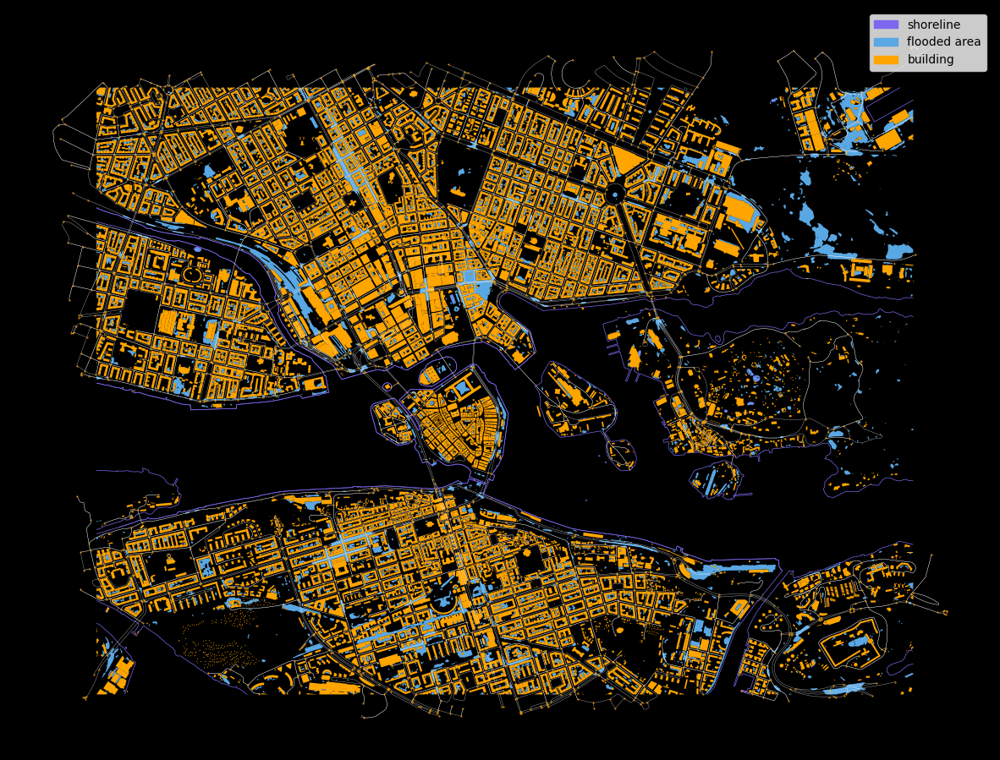

In [7]:
# Create a figure and axes object
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the datasets on the same axes.
byggnader_gdf.plot(ax=ax, color='orange', linewidth=0.5, zorder=4)
shoreline_gdf.plot(ax=ax, color='mediumslateblue', linewidth=0.5, zorder=3)
rain_gdf.plot(ax=ax, color='#59A7E3', linewidth=0.5, zorder=2)

# Plot the graph nodes and edges
edges.plot(ax=ax, linewidth=0.2, edgecolor='white', zorder=5)
nodes.plot(ax=ax, color='orange', markersize=.2, zorder=5)

# Legend
import matplotlib.patches as mpatches
shoreline_patch = mpatches.Patch(color='mediumslateblue', label='shoreline')
rain_patch = mpatches.Patch(color='#59A7E3', label='flooded area')
building_patch = mpatches.Patch(color='orange', label='building')

ax.legend(handles=[shoreline_patch, rain_patch, building_patch], loc='upper right')

fig.patch.set_facecolor('black') # Background
ax.set_axis_off()  # Remove the axes
plt.show()

## Get Class

In [ ]:
from shapely.geometry import LineString

def divide_linestring(linestring, num_divisions):
    """Divides a LineString into equal-length segments.

    Args:
        linestring (LineString): The LineString to divide.
        num_divisions (int): The desired number of segments.

    Returns:
        list: A list of LineString segments.
    """

    # Validate input
    if num_divisions <= 0:
        raise ValueError("Number of divisions must be a positive integer.")

    total_length = linestring.length
    segment_length = total_length / num_divisions

    segments = []
    current_distance = 0.0

    while current_distance < total_length:
        # Calculate the start and end points for the current segment
        segment_start = linestring.interpolate(current_distance)
        segment_end = linestring.interpolate(min(current_distance + segment_length, total_length))
        segments.append(LineString([segment_start, segment_end]))
        current_distance += segment_length

    return segments

def scale_to_custom_domain(data, new_min, new_max):
    """Scales data to a custom domain defined by new_min and new_max."""
    original_min = np.min(data)
    original_max = np.max(data)
    scaled_data = ((new_max - new_min) * (np.array(data) - original_min) / (original_max - original_min)) + new_min
    return scaled_data

In [ ]:
# Clip the edges
flooded_edges = edges.geometry.clip(rain_gdf)
print(len(edges))
print(len(flooded_edges))
print(flooded_edges)

# print(flooded_edges['numeric_index'])

4324
803
u           v           key
565820      1546340426  0      LINESTRING (675029.765 6578669.000, 675031.227...
1546340426  565820      0      LINESTRING (675031.227 6578669.529, 675029.765...
565820      158846292   0      LINESTRING (674869.965 6578730.000, 674869.684...
158846292   565820      0      LINESTRING (674869.684 6578730.887, 674869.965...
158846629   158846292   0      LINESTRING (674829.488 6578717.512, 674869.684...
                                                     ...                        
255902389   255902388   0      LINESTRING (675518.822 6582427.234, 675519.134...
197687225   255902389   0      LINESTRING (675524.832 6582429.000, 675518.822...
255902389   197687225   0      LINESTRING (675518.822 6582427.234, 675524.832...
            197687189   0      LINESTRING (675518.822 6582427.234, 675513.234...
197687189   255902389   0      LINESTRING (675513.234 6582426.000, 675518.822...
Name: geometry, Length: 803, dtype: geometry


In [ ]:
# Calculate lengths and division
flooded_edges_length = [line.length for line in flooded_edges]
division = scale_to_custom_domain(flooded_edges_length, 1, 10)
division = [round(x) for x in division]

In [ ]:
# Divide flooded edge into segment
all_divided_segments = []
for i, line in enumerate(flooded_edges):
    num_divisions = division[i]  # Get the division count for the current LineString
    segments = divide_linestring(line, num_divisions)  # Divide
    all_divided_segments.extend(segments)  # Add to the overall list

divided_segments = gpd.GeoSeries(all_divided_segments)

print(flooded_edges)
print(divided_segments)

segmented_flooded_edges = gpd.GeoSeries(all_divided_segments, crs = flooded_edges.crs) # maintain original coordinate system

u           v           key
565820      1546340426  0      LINESTRING (675029.765 6578669.000, 675031.227...
1546340426  565820      0      LINESTRING (675031.227 6578669.529, 675029.765...
565820      158846292   0      LINESTRING (674869.965 6578730.000, 674869.684...
158846292   565820      0      LINESTRING (674869.684 6578730.887, 674869.965...
158846629   158846292   0      LINESTRING (674829.488 6578717.512, 674869.684...
                                                     ...                        
255902389   255902388   0      LINESTRING (675518.822 6582427.234, 675519.134...
197687225   255902389   0      LINESTRING (675524.832 6582429.000, 675518.822...
255902389   197687225   0      LINESTRING (675518.822 6582427.234, 675524.832...
            197687189   0      LINESTRING (675518.822 6582427.234, 675513.234...
197687189   255902389   0      LINESTRING (675513.234 6582426.000, 675518.822...
Name: geometry, Length: 803, dtype: geometry
0       LINESTRING (675029.765 65786

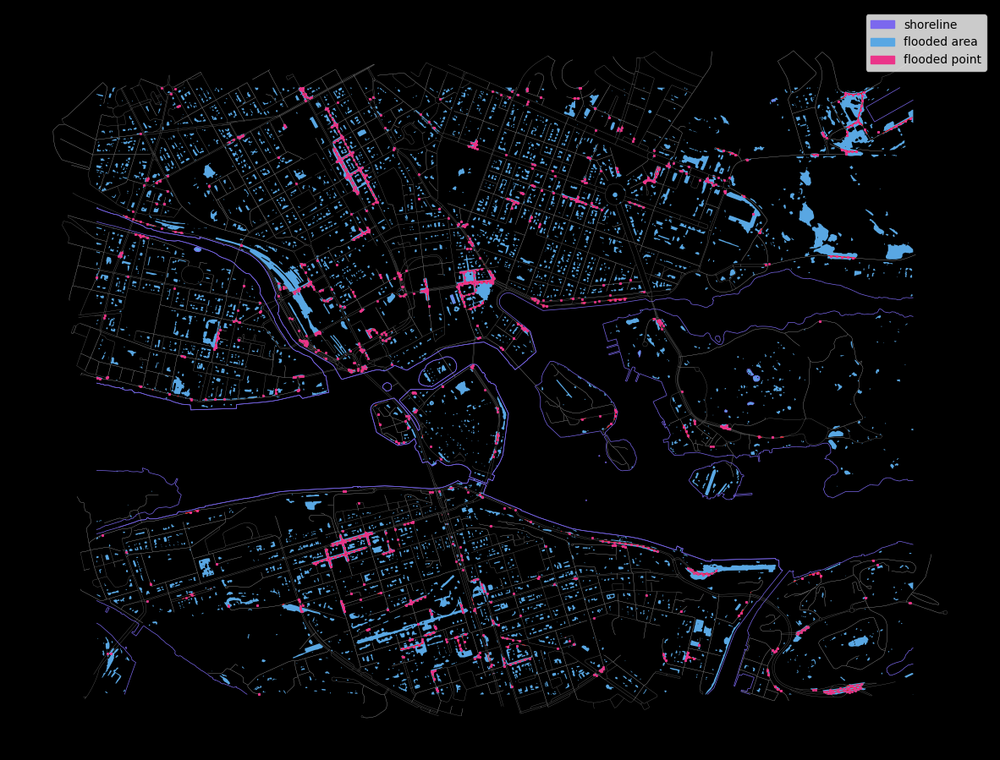

In [ ]:
# get ref point of segmented_flooded_edges
flooded_pt = segmented_flooded_edges.interpolate(0.5, normalized=True)

# Create a figure and axes object
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the datasets on the same axes.
shoreline_gdf.plot(ax=ax, color='mediumslateblue', linewidth=0.5, zorder=3)
rain_gdf.plot(ax=ax, color='#59A7E3', linewidth=0.5, zorder=2)

# Plot the graph
edges.plot(ax=ax, linewidth=0.2, edgecolor='grey', zorder=4)
flooded_edges.plot(ax=ax, linewidth=0.5, edgecolor='red', zorder=5)
flooded_pt.plot(ax=ax, color='#eb3489', markersize=3, linewidth=0.5, zorder=6)

# Legend
import matplotlib.patches as mpatches
shoreline_patch = mpatches.Patch(color='mediumslateblue', label='shoreline')
rain_patch = mpatches.Patch(color='#59A7E3', label='flooded area')
flooded_pt_patch = mpatches.Patch(color='#eb3489', label='flooded point')

ax.legend(handles=[shoreline_patch, rain_patch, flooded_pt_patch], loc='upper right')

fig.patch.set_facecolor('black') # background
ax.set_axis_off()  # Remove the axes
plt.show()

In [ ]:
# flooded point to gdf
print(flooded_pt)
flooded_pt_gdf = gpd.GeoDataFrame(flooded_pt, geometry=flooded_pt, crs=flooded_pt.crs)
print(flooded_pt_gdf)

# Perform a spatial join to find nearest edge for each point
nearest_edges = gpd.sjoin_nearest(flooded_pt_gdf, edges, how='left', distance_col='distance')
full_flooded_edges_indices = set(nearest_edges['numeric_index'])
full_flooded_edges = edges[edges['numeric_index'].isin(full_flooded_edges_indices)]

0       POINT (675030.496 6578669.265)
1       POINT (675030.496 6578669.265)
2       POINT (674869.825 6578730.444)
3       POINT (674869.825 6578730.444)
4       POINT (674839.537 6578720.856)
                     ...              
1430    POINT (675518.978 6582426.617)
1431    POINT (675521.827 6582428.117)
1432    POINT (675521.827 6582428.117)
1433    POINT (675516.028 6582426.617)
1434    POINT (675516.028 6582426.617)
Length: 1435, dtype: geometry
                                   0                        geometry
0     POINT (675030.496 6578669.265)  POINT (675030.496 6578669.265)
1     POINT (675030.496 6578669.265)  POINT (675030.496 6578669.265)
2     POINT (674869.825 6578730.444)  POINT (674869.825 6578730.444)
3     POINT (674869.825 6578730.444)  POINT (674869.825 6578730.444)
4     POINT (674839.537 6578720.856)  POINT (674839.537 6578720.856)
...                              ...                             ...
1430  POINT (675518.978 6582426.617)  POINT (675518.978 65

In [ ]:
# Create bounding box from the flooded point
from shapely.geometry import Point, box
width = 100
flooded_boxes = gpd.GeoSeries([box(minx=c.x - width/2, miny=c.y - width/2, maxx=c.x + width/2, maxy=c.y + width/2) for c in flooded_pt])

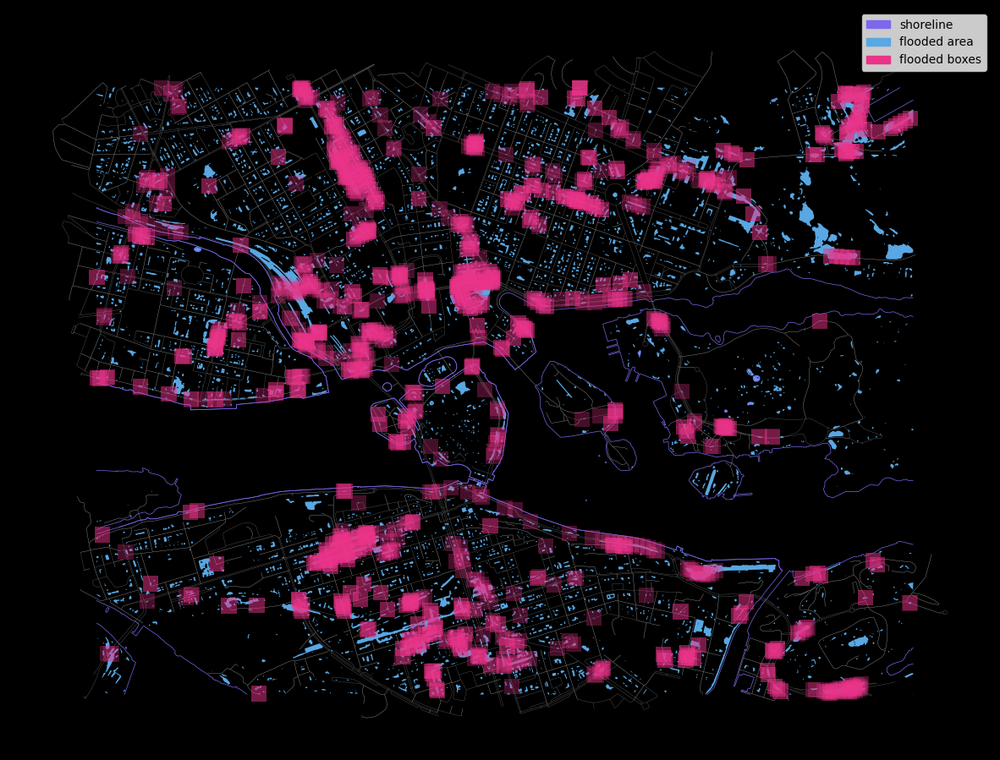

In [ ]:
# Create a figure and axes object
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the datasets on the same axes.
shoreline_gdf.plot(ax=ax, color='mediumslateblue', linewidth=0.5, zorder=3)
rain_gdf.plot(ax=ax, color='#59A7E3', linewidth=0.5, zorder=2)

# Plot the graph
edges.plot(ax=ax, linewidth=0.2, edgecolor='grey', zorder=4)
flooded_boxes.plot(ax=ax, color='#eb3489', linewidth=0.5, zorder=7, alpha=0.3)

# Legend
import matplotlib.patches as mpatches
shoreline_patch = mpatches.Patch(color='mediumslateblue', label='shoreline')
rain_patch = mpatches.Patch(color='#59A7E3', label='flooded area')
boxes_patch = mpatches.Patch(color='#eb3489', label='flooded boxes')

ax.legend(handles=[shoreline_patch, rain_patch, boxes_patch], loc='upper right')

fig.patch.set_facecolor('black') # background
ax.set_axis_off()  # Remove the axes
plt.show()

In [ ]:
# get all the edge that are intersect with the boxes
from shapely.ops import unary_union

# Combine boxes into a single geometry
flooded_area = unary_union(flooded_boxes)

# Spatial join to get edges that intersect the flooded area
flood_risk_edges = gpd.sjoin(edges, gpd.GeoDataFrame(geometry=[flooded_area]), how='inner', op='intersects')
print(len(flood_risk_edges))

# drop the flooded_edges_neighboor which has the same 'numeric_index' with the full_flooded_edges
flood_risk_edges = flood_risk_edges[~flood_risk_edges['numeric_index'].isin(full_flooded_edges['numeric_index'])]
print(len(flood_risk_edges))

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
<ipython-input-17-6d9ec977fae9>:8: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3006
Right CRS: None

  flood_risk_edges = gpd.sjoin(edges, gpd.GeoDataFrame(geometry=[flooded_area]), how='inner', op='intersects')


2013
1305


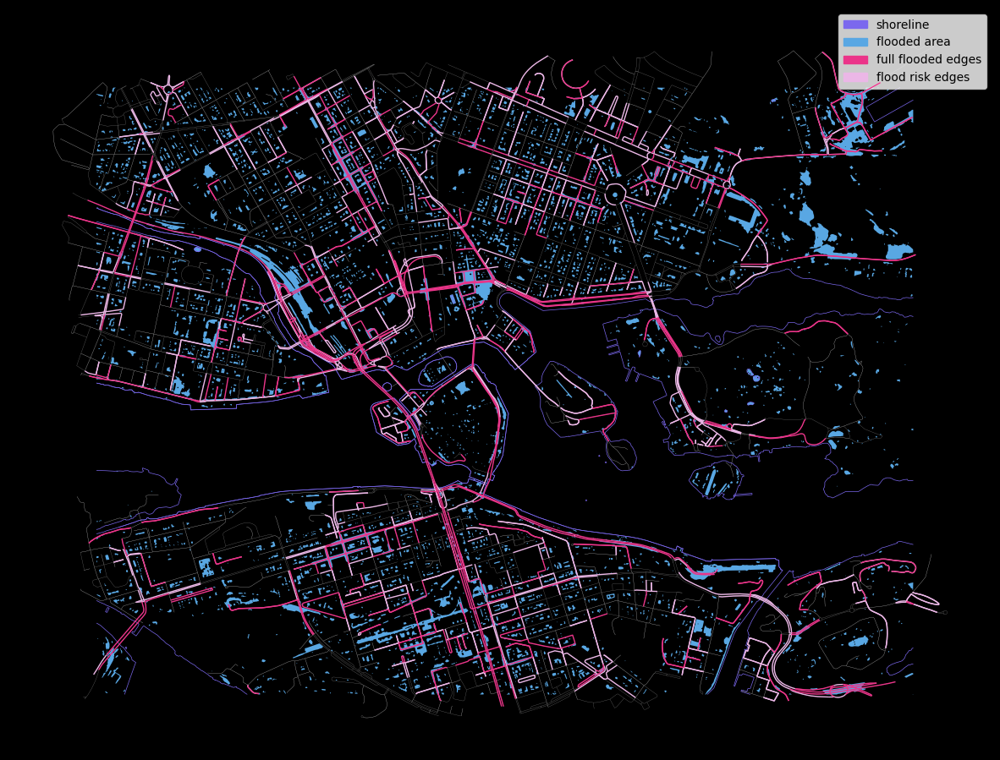

In [ ]:
# Create a figure and axes object
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the datasets on the same axes.
shoreline_gdf.plot(ax=ax, color='mediumslateblue', linewidth=0.5, zorder=3)
rain_gdf.plot(ax=ax, color='#59A7E3', linewidth=0.5, zorder=2)

# Plot the graph
edges.plot(ax=ax, linewidth=0.2, edgecolor='grey', zorder=4)
full_flooded_edges.plot(ax=ax, color='#eb3489', linewidth=1, zorder=7)
flood_risk_edges.plot(ax=ax, color='#ebb7e6', linewidth=1, zorder=5)

# Legend
import matplotlib.patches as mpatches
shoreline_patch = mpatches.Patch(color='mediumslateblue', label='shoreline')
rain_patch = mpatches.Patch(color='#59A7E3', label='flooded area')
full_flooded_edges_patch = mpatches.Patch(color='#eb3489', label='full flooded edges')
flood_risk_edges_patch = mpatches.Patch(color='#ebb7e6', label='flood risk edges')

ax.legend(handles=[shoreline_patch, rain_patch,full_flooded_edges_patch, flood_risk_edges_patch], loc='upper right')

fig.patch.set_facecolor('black') # background
ax.set_axis_off()  # Remove the axes
plt.show()

## Assign Class to Edges

In [ ]:
# Get the numeric indices as lists for efficient lookup
full_flooded_indices = full_flooded_edges['numeric_index'].tolist()
flood_risk_indices = flood_risk_edges['numeric_index'].tolist()

print(full_flooded_indices)
print(flood_risk_indices)

[1, 8, 10, 13, 15, 17, 19, 22, 23, 24, 25, 26, 27, 28, 30, 32, 33, 37, 42, 46, 47, 54, 85, 90, 91, 92, 94, 101, 104, 112, 115, 116, 117, 118, 119, 121, 133, 134, 135, 136, 148, 151, 154, 160, 163, 164, 165, 166, 171, 174, 176, 177, 181, 194, 210, 212, 216, 230, 256, 260, 265, 269, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 291, 299, 300, 314, 316, 332, 346, 347, 349, 350, 351, 365, 378, 379, 392, 416, 420, 421, 444, 445, 446, 448, 474, 477, 510, 511, 512, 517, 524, 525, 526, 575, 579, 604, 608, 616, 617, 618, 619, 627, 637, 643, 644, 645, 648, 657, 658, 659, 660, 662, 663, 666, 669, 672, 677, 678, 689, 690, 694, 710, 713, 723, 738, 801, 804, 831, 835, 839, 854, 863, 864, 866, 867, 868, 877, 879, 880, 894, 895, 909, 922, 925, 931, 953, 954, 996, 997, 998, 999, 1000, 1001, 1026, 1031, 1045, 1047, 1053, 1059, 1062, 1066, 1076, 1082, 1085, 1097, 1099, 1100, 1105, 1117, 1118, 1120, 1194, 1195, 1216, 1218, 1224, 1225, 1250, 1252, 1253, 1258, 1267, 1270, 1271, 1272, 1291, 1303, 1309, 1

In [ ]:
# Iterate over edges in the graph, accessing them by (u, v, key)
for u, v, key in G.edges(keys=True):
    index = G[u][v][key].get('numeric_index')  # Assuming 'numeric_index' is an edge attribute
    if index in full_flooded_indices:
        G[u][v][key]['class'] = 1 # flooded
    elif index in flood_risk_indices:
        G[u][v][key]['class'] = 2 # risk
    else:
        G[u][v][key]['class'] = 0 # safe

# Print class
print([e[2]['class'] for e in G.edges(data=True)])

# print G edge dataframe
print(ox.graph_to_gdfs(G)[1])

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
# extract node and edge again
nodes, edges = ox.graph_to_gdfs(G)

## Other

In [ ]:
print(full_flooded_edges['numeric_index'])

u            v           key
119024       34586358    0         1
119046       26122666    0         8
119052       119053      0        10
119053       119052      0        13
119054       119057      0        15
                                ... 
9692987899   2249281224  0      4278
9970689128   4959975720  0      4298
10230687159  299557856   0      4305
11418032300  180202270   0      4312
11709302295  4318566052  0      4318
Name: numeric_index, Length: 708, dtype: int64


In [ ]:
byggnader_gdf

,,objektidentitet,versiongiltigfran,lagesosakerhetplan,lagesosakerhethojd,ursprunglig_organisation,objektversion,objekttypnr,objekttyp,insamlingslage,byggnadsnamn1,byggnadsnamn2,byggnadsnamn3,husnummer,huvudbyggnad,andamal1,andamal2,andamal3,andamal4,andamal5,geometry
0,0,6445a82f-1a33-4314-8b98-29b52038152c,2020-11-25T13:44:17.591999,2.00,2.50,Lantmäteriet,2,2063,Samhällsfunktion,Takkant,,,,4,Nej,Samhällsfunktion;Ospecificerad,,,,,"POLYGON ((18.07778 59.34391, 18.07780 59.34393..."
1,0,4fcd6cf1-9fd3-4cf2-809e-90fe04d30ba3,2021-04-12T11:20:49.903000,0.05,0.50,Stockholm,2,2061,Bostad,Fasad,,,,1,Nej,Bostad;Flerfamiljshus,Verksamhet;,,,,"POLYGON ((18.07886 59.34310, 18.07891 59.34309..."
2,0,97e6d93f-d1b5-468f-9cd8-470e95ca8be9,2011-03-22T08:19:55.198002,2.00,2.50,Lantmäteriet,1,2061,Bostad,Takkant,,,,1,Nej,Bostad;Flerfamiljshus,,,,,"POLYGON ((18.07880 59.34287, 18.07883 59.34290..."
3,0,60ebdc29-fbd6-4f79-91bb-c394bdb9ad13,2016-10-19T14:40:38.889999,0.05,NaN,Stockholm,2,2064,Verksamhet,Fasad,,,,1,Nej,Verksamhet;,Bostad;Flerfamiljshus,,,,"POLYGON ((18.07817 59.34250, 18.07816 59.34250..."
4,0,813f7dd6-f7cd-4816-aec0-6012e16a1543,2019-04-05T08:35:58.301998,0.15,0.20,Stockholm,3,2061,Bostad,Takkant,,,,2,Nej,Bostad;Flerfamiljshus,,,,,"POLYGON ((18.07873 59.34218, 18.07870 59.34215..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9220,0,d52c1d72-1c69-4da6-b69a-795c283193fb,2020-11-25T12:38:06.308000,2.00,2.50,Lantmäteriet,3,2061,Bostad,Takkant,,,,282,Nej,Bostad;Småhus friliggande,,,,,"POLYGON ((18.12358 59.33179, 18.12353 59.33179..."
9221,0,75c19050-2352-4d5a-99e1-98beade0d1c7,2018-10-02T08:39:06.606000,0.30,0.50,Stockholm,2,2066,Komplementbyggnad,Ospecificerad,,,,515,Nej,Komplementbyggnad;,,,,,"POLYGON ((18.12367 59.33274, 18.12275 59.33279..."
9222,0,1ac2c9e4-84c2-4ab2-861f-beacfd8459c7,2020-11-25T14:24:35.917999,0.05,0.08,Lantmäteriet,4,2062,Industri,Fasad,,,,228,Nej,Industri;Ospecificerad,,,,,"POLYGON ((18.12436 59.34024, 18.12420 59.34020..."
9223,0,eb3db3e0-78bb-4dc6-80e0-b6812d6301da,2014-01-29T09:53:10.235000,2.00,NaN,Stockholm,2,2067,Övrig byggnad,Ospecificerad,,,,60,Nej,Övrig byggnad;,,,,,"POLYGON ((18.12434 59.34009, 18.12418 59.34005..."


In [ ]:
# prompt: in the byggnader_gdf in the column andamal1 print all the unique value

unique_values = byggnader_gdf['andamal1'].unique()
print(unique_values)


['Samhällsfunktion;Ospecificerad' 'Bostad;Flerfamiljshus' 'Verksamhet;'
 'Komplementbyggnad;' 'Samhällsfunktion;Skola' 'Övrig byggnad;'
 'Bostad;Småhus radhus' 'Samhällsfunktion;Samfund'
 'Bostad;Småhus friliggande' 'Samhällsfunktion;Brandstation'
 'Samhällsfunktion;Högskola' 'Samhällsfunktion;Badhus'
 'Samhällsfunktion;Kulturbyggnad' 'Samhällsfunktion;Järnvägsstation'
 'Industri;Ospecificerad' 'Bostad;Småhus kedjehus'
 'Samhällsfunktion;Sjukhus' 'Samhällsfunktion;Polisstation'
 'Bostad;Småhus med flera lägenheter' 'Samhällsfunktion;Kommunhus'
 'Samhällsfunktion;Vårdcentral' 'Samhällsfunktion;Sporthall'
 'Samhällsfunktion;Ishall' 'Industri;Tillverkning']


In [ ]:
# Get building information
residence_byggnader_gdf = byggnader_gdf[byggnader_gdf['andamal1'].str.contains('Bostad', case=False)]
print(len(residence_byggnader_gdf))

school_byggnader_gdf = byggnader_gdf[byggnader_gdf['andamal1'].str.contains('Skola', case=False)]
print(len(school_byggnader_gdf))

hospital_byggnader_gdf = byggnader_gdf[byggnader_gdf['andamal1'].str.contains('Sjukhus', case=False)]
print(len(hospital_byggnader_gdf))

industry_byggnader_gdf = byggnader_gdf[byggnader_gdf['andamal1'].str.contains('Industri', case=False)]
print(len(industry_byggnader_gdf))

firestation_byggnader_gdf = byggnader_gdf[byggnader_gdf['andamal1'].str.contains('Brandstation', case=False)]
print(len(firestation_byggnader_gdf))

policestation_byggnader_gdf = byggnader_gdf[byggnader_gdf['andamal1'].str.contains('Polisstation', case=False)]
print(len(policestation_byggnader_gdf))


5359
140
22
57
4
8


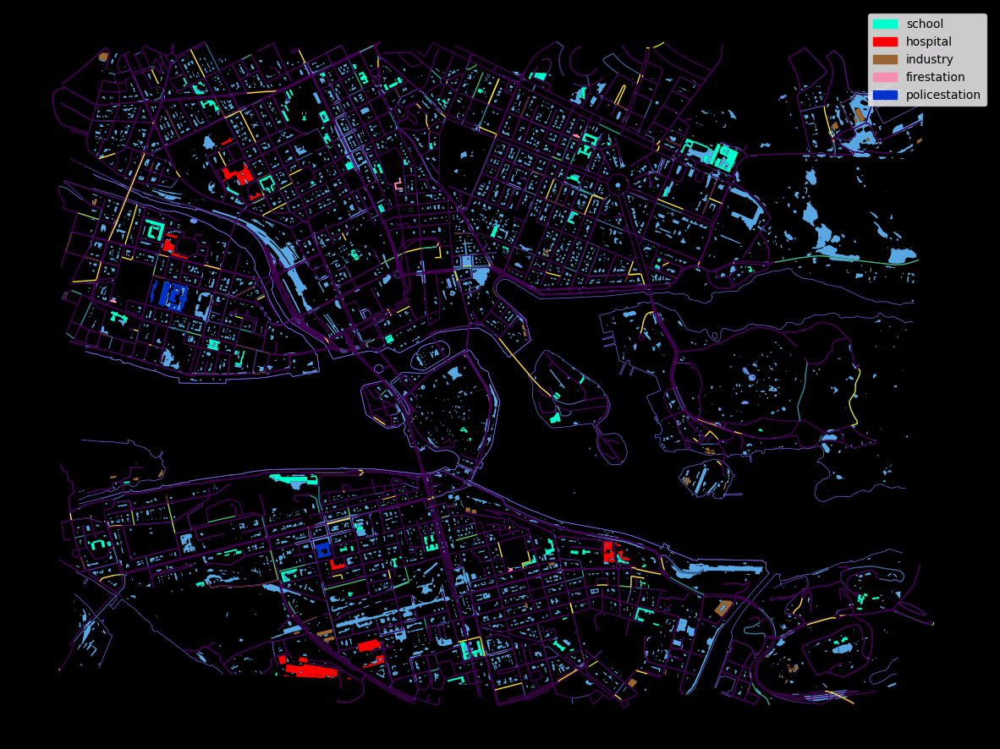

In [ ]:
# create figure and axes object
fig, ax = plt.subplots(figsize=(15, 15))

# plot the dataset
shoreline_gdf.plot(ax=ax, color='mediumslateblue', linewidth=0.5, zorder=3)
rain_gdf.plot(ax=ax, color='#59A7E3', linewidth=0.5, zorder=2)

# color preset
school_cl = '#00ffcc'
hospital_cl = '#ff0000'
industry_cl = '#996633'
firestation_cl = '#F48FB1'
policestation_cl = '#0033cc'

# plot the graph
edges.plot(ax=ax, linewidth=1, edgecolor=ec, zorder=5)
# residence_byggnader_gdf.plot(ax=ax, color='orange', linewidth=0.5, zorder=4)
school_byggnader_gdf.plot(ax=ax, color=school_cl, linewidth=0.5, zorder=4)
hospital_byggnader_gdf.plot(ax=ax, color=hospital_cl, linewidth=0.5, zorder=4)
industry_byggnader_gdf.plot(ax=ax, color=industry_cl, linewidth=0.5, zorder=4)
firestation_byggnader_gdf.plot(ax=ax, color=firestation_cl, linewidth=0.5, zorder=4)
policestation_byggnader_gdf.plot(ax=ax, color=policestation_cl, linewidth=0.5, zorder=4)

# Legend
import matplotlib.patches as mpatches
school_patch = mpatches.Patch(color=school_cl, label='school')
hospital_patch = mpatches.Patch(color=hospital_cl, label='hospital')
industry_patch = mpatches.Patch(color=industry_cl, label='industry')
firestation_patch = mpatches.Patch(color=firestation_cl, label='firestation')
policestation_patch = mpatches.Patch(color=policestation_cl, label='policestation')

ax.legend(handles=[school_patch, hospital_patch, industry_patch, firestation_patch, policestation_patch])

fig.patch.set_facecolor('black') # background
ax.set_axis_off()  # Remove the axes
plt.show()

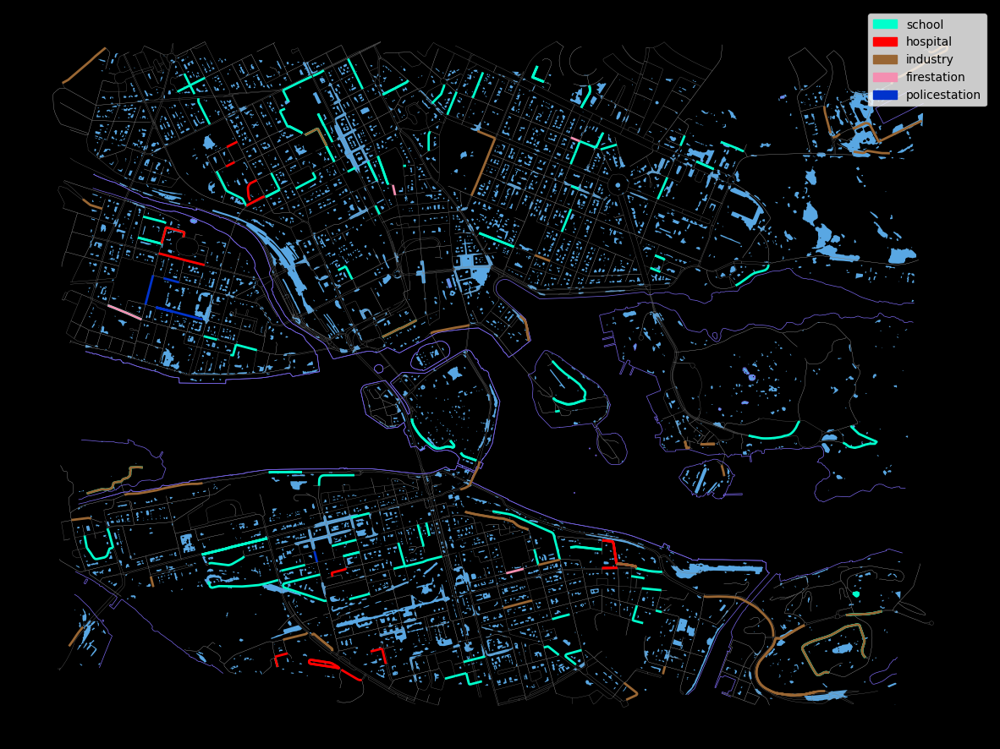

In [ ]:
# get the building's representative point
school_representative_points = school_byggnader_gdf.representative_point()
hospital_representative_points = hospital_byggnader_gdf.representative_point()
industry_representative_points = industry_byggnader_gdf.representative_point()
firestation_representative_points = firestation_byggnader_gdf.representative_point()
policestation_representative_points = policestation_byggnader_gdf.representative_point()

# Find index of nearest edge
school_nearest_edges_i = ox.distance.nearest_edges(G_cost, X=school_representative_points.geometry.x, Y=school_representative_points.geometry.y, return_dist=False)
hospital_nearest_edges_i = ox.distance.nearest_edges(G_cost, X=hospital_representative_points.geometry.x, Y=hospital_representative_points.geometry.y, return_dist=False)
industry_nearest_edges_i = ox.distance.nearest_edges(G_cost, X=industry_representative_points.geometry.x, Y=industry_representative_points.geometry.y, return_dist=False)
firestation_nearest_edges_i = ox.distance.nearest_edges(G_cost, X=firestation_representative_points.geometry.x, Y=firestation_representative_points.geometry.y, return_dist=False)
policestation_nearest_edges_i = ox.distance.nearest_edges(G_cost, X=policestation_representative_points.geometry.x, Y=policestation_representative_points.geometry.y, return_dist=False)


# Filter nearest edge gdf
school_nearest_edges = gpd.GeoSeries(edges.loc[school_nearest_edges_i].geometry)
hospital_nearest_edges = gpd.GeoSeries(edges.loc[hospital_nearest_edges_i].geometry)
industry_nearest_edges = gpd.GeoSeries(edges.loc[industry_nearest_edges_i].geometry)
firestation_nearest_edges = gpd.GeoSeries(edges.loc[firestation_nearest_edges_i].geometry)
policestation_nearest_edges = gpd.GeoSeries(edges.loc[policestation_nearest_edges_i].geometry)

# Create a figure and axes object
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the datasets on the same axes.
shoreline_gdf.plot(ax=ax, color='mediumslateblue', linewidth=0.5, zorder=3)
rain_gdf.plot(ax=ax, color='#59A7E3', linewidth=0.5, zorder=2)

# Plot the graph
edges.plot(ax=ax, linewidth=0.2, edgecolor='grey', zorder=4)

# Plot the nearest edges
school_nearest_edges.plot(ax=ax, color=school_cl, linewidth=2, zorder=5)
hospital_nearest_edges.plot(ax=ax, color=hospital_cl, linewidth=2, zorder=5)
industry_nearest_edges.plot(ax=ax, color=industry_cl, linewidth=2, zorder=5)
firestation_nearest_edges.plot(ax=ax, color=firestation_cl, linewidth=2, zorder=5)
policestation_nearest_edges.plot(ax=ax, color=policestation_cl, linewidth=2, zorder=5)

# Legend
school_patch = mpatches.Patch(color=school_cl, label='school')
hospital_patch = mpatches.Patch(color=hospital_cl, label='hospital')
industry_patch = mpatches.Patch(color=industry_cl, label='industry')
firestation_patch = mpatches.Patch(color=firestation_cl, label='firestation')
policestation_patch = mpatches.Patch(color=policestation_cl, label='policestation')

ax.legend(handles=[school_patch, hospital_patch, industry_patch, firestation_patch, policestation_patch])

fig.patch.set_facecolor('black') # background
ax.set_axis_off()  # Remove the axes
plt.show()


# Node valence

In [ ]:
nodes = nodes.reset_index() # convert the osmid currently is index to column
print(nodes)

            osmid          y          x          highway  street_count  \
0          119024  59.319575  18.033155  traffic_signals             3   
1          119039  59.320697  18.045443              NaN             2   
2          119042  59.321137  18.050676              NaN             2   
3          119046  59.324654  18.062138              NaN             3   
4          119052  59.323834  18.064586              NaN             3   
...           ...        ...        ...              ...           ...   
2121  11709302271  59.326765  18.042430              NaN             3   
2122  11709302295  59.328256  18.031350              NaN             3   
2123  11830115094  59.332456  18.077017              NaN             4   
2124  11886258547  59.316025  18.075257              NaN             2   
2125  11895745719  59.332889  18.075848              NaN             4   

                       geometry  
0     POINT (18.03316 59.31958)  
1     POINT (18.04544 59.32070)  
2     POI

In [ ]:
# get node valence
def get_node_valence(graph, node):
  return len(list(graph.neighbors(node)))

nodes['valence'] = 0  # Initialize with zeros

# Iterate over nodes in the GeoDataFrame
for index, row in nodes.iterrows():
    node_id = row['osmid'] # Assuming 'osmid' column contains node IDs
    valence = get_node_valence(G, node_id)
    nodes.at[index, 'valence'] = valence

print(nodes['valence'])

0       3
1       2
2       2
3       3
4       3
       ..
2121    2
2122    3
2123    2
2124    1
2125    2
Name: valence, Length: 2126, dtype: int64


# Capacity

In [ ]:
# Reset edges, nodes
nodes, edges = ox.graph_to_gdfs(G)
print(edges['lanes'])

u            v            key
119024       21651762     0           2
             34586358     0           2
             35123521     0      [3, 2]
21651762     119024       0           2
34586358     119024       0           2
                                  ...  
8976132812   7054063      0         NaN
9820005115   25646662     0         NaN
10049582462  10049582459  0           1
11365124021  1550839903   0         NaN
11709300025  1673767230   0         NaN
Name: lanes, Length: 4324, dtype: object


In [ ]:
# convert lanes value nan = 0
edges['lanes'] = edges['lanes'].fillna(1)
print(edges['lanes'])

u            v            key
119024       21651762     0           2
             34586358     0           2
             35123521     0      [3, 2]
21651762     119024       0           2
34586358     119024       0           2
                                  ...  
8976132812   7054063      0           1
9820005115   25646662     0           1
10049582462  10049582459  0           1
11365124021  1550839903   0           1
11709300025  1673767230   0           1
Name: lanes, Length: 4324, dtype: object


In [ ]:
# lanes list
lanes_list = edges['lanes'].tolist()
print(lanes_list)
print(len(lanes_list))

# if there is list take the first item then convert if there is string convert to int
lanes_list = [int(lane[0]) if isinstance(lane, list) else int(lane) for lane in lanes_list]
print(lanes_list)
print(len(lanes_list))

['2', '2', ['3', '2'], '2', '2', '2', '2', '2', ['3', '2'], '1', 1, '2', 1, '2', 1, 1, '2', '1', '1', 1, 1, ['1', '2'], '2', '1', '2', ['3', '2'], '1', ['3', '2'], '1', ['1', '2'], '2', 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, '2', '1', '2', 1, '2', '2', 1, '2', 1, '2', '1', 1, 1, ['3', '1'], 1, '1', 1, 1, 1, 1, ['1', '2'], '3', '1', 1, 1, 1, 1, 1, 1, 1, ['3', '1'], 1, '1', '3', 1, '3', 1, 1, 1, 1, 1, ['1', '2'], '3', 1, 1, 1, '2', 1, 1, 1, 1, 1, '2', '2', 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, '2', '2', '2', 1, '1', '2', '2', '2', '1', '1', '2', 1, ['3', '2'], 1, '1', 1, 1, 1, 1, '2', '2', 1, 1, 1, 1, ['3', '2'], '2', 1, 1, 1, 1, 1, 1, 1, 1, '2', '2', 1, 1, 1, 1, 1, 1, 1, 1, '2', 1, 1, 1, 1, 1, 1, 1, '2', 1, 1, '2', '1', 1, 1, 1, 1, 1, '2', 1, 1, '2', 1, 1, '2', 1, 1, '2', '2', 1, 1, '2', '2', 1, '1', '2', '2', 1, 1, '2', 1, 1, 1, 1, '2', 1, '2', 1, 1, 1, '2', 1, 1, 1, 1, 1, '2', 1, '2', 1, 1, '2', 1, 1, 1, '2', '4', 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

In [ ]:
# add lanes attribute
edges['lanes'] = lanes_list
print(edges['lanes'])

u            v            key
119024       21651762     0      2
             34586358     0      2
             35123521     0      3
21651762     119024       0      2
34586358     119024       0      2
                                ..
8976132812   7054063      0      1
9820005115   25646662     0      1
10049582462  10049582459  0      1
11365124021  1550839903   0      1
11709300025  1673767230   0      1
Name: lanes, Length: 4324, dtype: int64



# Topography and Slopes

In [8]:
# File paths
elevation_raster_ds =  '/content/drive/MyDrive/GraphML_G05/Dataset/Terrain_Stockholm.tif'

In [9]:
# Check the CRS of the raster file
with rasterio.open(elevation_raster_ds) as src:
    raster_crs = src.crs
print(f"Raster CRS: {raster_crs}")

# Check the CRS of the graph
graph_crs = G.graph['crs']
print(f"Graph CRS: {graph_crs}")

# Project the graph to the CRS of the raster file
G_projected = ox.project_graph(G, to_crs=raster_crs)

# Check the CRS of the graph
graph_crs_projected = G_projected.graph['crs']
print(f"Graph CRS: {graph_crs_projected}")

Raster CRS: EPSG:3006
Graph CRS: epsg:4326
Graph CRS: PROJCS["SWEREF99 TM",GEOGCS["SWEREF99",DATUM["SWEREF99",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6619"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4619"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Northing",NORTH],AXIS["Easting",EAST],AUTHORITY["EPSG","3006"]]


In [10]:
# Add z values to the nodes of the graph as an attribute
G = ox.elevation.add_node_elevations_raster(G_projected, filepath= elevation_raster_ds)
G = ox.elevation.add_edge_grades(G_projected, add_absolute=True, precision=None)

In [11]:
# Get the elevation values of the nodes
node_elevations = [data['elevation'] for _, data in G.nodes(data=True)]
print(node_elevations)

import numpy as np
nan_count = sum(np.isnan(x) for x in node_elevations)
print(f"Number of NaN values in node elevations: {nan_count}")

[7.779296875, 14.982421875, 3.7509765625, 4.595703125, 3.068359375, 3.1142578125, 2.6279296875, 2.626953125, 2.796875, 3.4892578125, 2.44140625, 3.05078125, 7.3916015625, 2.4267578125, 2.5380859375, 8.6787109375, 2.365234375, 7.3935546875, 7.3935546875, 1.6064453125, 18.45703125, 18.81640625, 14.205078125, 19.8427734375, 19.8427734375, 22.306640625, 19.6337890625, 19.6279296875, 20.328125, 20.515625, 3.0771484375, 4.4853515625, 3.162109375, 3.224609375, 3.1181640625, 3.1318359375, 2.984375, 3.12109375, 7.5751953125, 3.1025390625, 8.7626953125, 3.5498046875, 18.29296875, 18.1259765625, 20.2763671875, 16.25390625, 18.26953125, 16.37109375, 16.4072265625, 18.123046875, 19.15234375, 18.9814453125, 21.8642578125, 26.0986328125, 26.078125, nan, 26.1357421875, 26.1572265625, 23.2158203125, 23.12109375, 23.8759765625, nan, nan, 30.568359375, 3.3466796875, 3.40625, 2.4638671875, 2.0966796875, 3.7958984375, 9.6083984375, 9.6416015625, 8.625, 8.0029296875, 5.12890625, 5.8564453125, 4.9716796875, 

In [12]:
# project df to graph crs
byggnader_gdf = ox.projection.project_gdf(byggnader_gdf, to_crs=graph_crs, to_latlong=False)
shoreline_gdf = ox.projection.project_gdf(shoreline_gdf, to_crs=graph_crs, to_latlong=False)
rain_gdf = ox.projection.project_gdf(rain_gdf, to_crs=graph_crs, to_latlong=False)

# Project edge and node into graph crs
edges = ox.project_gdf(edges, to_crs=graph_crs, to_latlong=False)
nodes = ox.project_gdf(nodes, to_crs=graph_crs, to_latlong=False)

<ipython-input-13-00b9ba29371f>:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('autumn_r')
<ipython-input-13-00b9ba29371f>:10: UserWarning: discarding the gdf_nodes geometry column, though its values differ from the coordinates in the x and y columns
  G_elev = ox.graph_from_gdfs(nodes,edges)


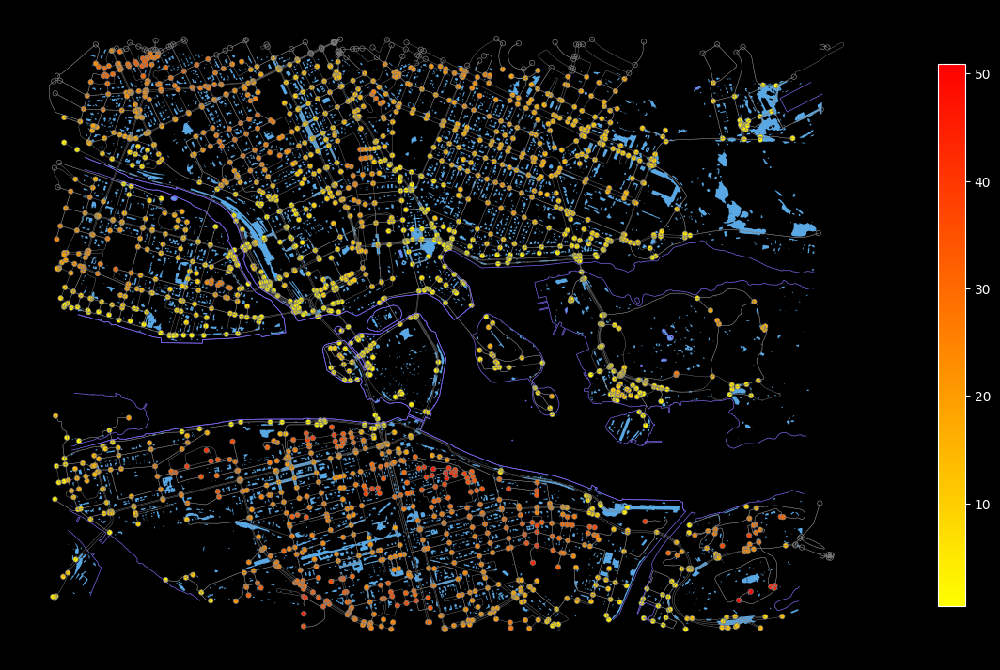

In [13]:
# Create a color map
cmap = plt.cm.get_cmap('autumn_r')

# Normalize the elevations to range between 0 and 1
norm_elevations = [(elevation - min(node_elevations)) / (max(node_elevations) - min(node_elevations)) for elevation in node_elevations]

# Get the colors for each node
node_colors = [cmap(norm_elevation) for norm_elevation in norm_elevations]

G_elev = ox.graph_from_gdfs(nodes,edges)
nodes_elev, edges_elev = ox.graph_to_gdfs(G_elev)

# create figure and axes object
fig, ax = plt.subplots(figsize=(15, 15))

# plot the dataset
shoreline_gdf.plot(ax=ax, color='mediumslateblue', linewidth=0.5, zorder=3)
rain_gdf.plot(ax=ax, color='#59A7E3', linewidth=0.2, zorder=2)

# plot the graph
nodes_elev.plot(ax=ax, color=node_colors, markersize=15, zorder=2, edgecolor='gray', linewidth=0.5)

# plot the graph edges
edges_elev.plot(ax=ax, linewidth=0.3, edgecolor='grey', zorder=5)

# Create ScalarMappable object for colorbar
from matplotlib.cm import ScalarMappable
sm = ScalarMappable(cmap=cmap, norm=plt.Normalize(min(node_elevations), max(node_elevations)))
sm.set_array([]) # This is necessary even if you're not plotting data with the mappable

# Add the colorbar
cbar = fig.colorbar(sm, ax=ax, shrink=0.5, location='right') # 'shrink' adjusts size, 'location' sets position

# Customize the colorbar (optional)
cbar.ax.set_title('Elevation')
cbar.ax.tick_params(labelsize=10, colors='white') # White ticks for dark background
cbar.outline.set_edgecolor('white') # White outline

fig.patch.set_facecolor('black') # background
ax.set_axis_off()  # Remove the axes
plt.show()

#Land Cover (Permeability)

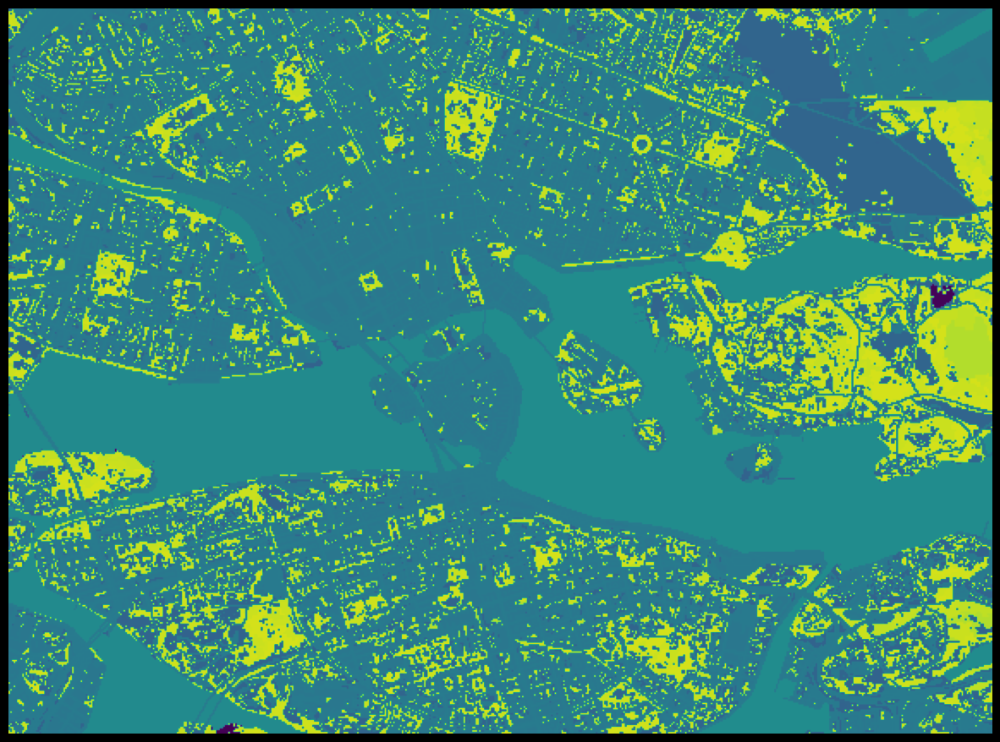

In [ ]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

tiff_file = '/content/drive/MyDrive/GraphML_G05/Dataset/Nationella_marktäckedata__NMD__Stockholm.tif'

# Open the file
src = rasterio.open(tiff_file)

# Plot the file
fig, ax = plt.subplots(figsize=(15,15))
show(src, ax=ax, cmap='viridis')

fig.patch.set_facecolor('black') # background
ax.axis('off')

plt.show()

In [ ]:
import rasterio
import rasterio.features
import geopandas as gpd
from shapely.geometry import shape

tiff_file = '/content/drive/MyDrive/GraphML_G05/Dataset/Nationella_marktäckedata__NMD__Stockholm.tif'

# Open the file
src = rasterio.open(tiff_file)

# Read the first band of the raster
band1 = src.read(1)

# Mask the non-data pixels
mask = band1 != src.nodata

# Extract shapes and values from the array
shapes = list(rasterio.features.shapes(band1, mask=mask, transform=src.transform))

# Convert shapes and values to a GeoPandas DataFrame
geometries = [shape(geom) for geom, value in shapes]
values = [value for geom, value in shapes]
gdf = gpd.GeoDataFrame({'geometry': geometries, 'value': values})

# Set the CRS of the DataFrame to the CRS of the raster
gdf.crs = src.crs

# Change the CRS of the DataFrame to EPSG:4326
gdf = gdf.to_crs("EPSG:4326")

print(gdf)

                                                geometry  value
0      POLYGON ((18.02630 59.34635, 18.02629 59.34626...   51.0
1      POLYGON ((18.02647 59.34634, 18.02646 59.34625...   52.0
2      POLYGON ((18.02717 59.34633, 18.02717 59.34624...   42.0
3      POLYGON ((18.02735 59.34632, 18.02734 59.34623...   53.0
4      POLYGON ((18.02788 59.34631, 18.02787 59.34622...   52.0
...                                                  ...    ...
25442  POLYGON ((18.11605 59.30631, 18.11605 59.30622...   52.0
25443  POLYGON ((18.11623 59.30630, 18.11622 59.30621...   51.0
25444  POLYGON ((18.11886 59.30624, 18.11885 59.30615...  116.0
25445  POLYGON ((18.11941 59.30650, 18.11939 59.30623...   42.0
25446  POLYGON ((18.02875 59.34629, 18.02875 59.34620...   53.0

[25447 rows x 2 columns]


In [ ]:
# Print the CRS of the GeoDataFrame
print("CRS of gdf:", gdf.crs)

# Print the CRS of the graph
print("CRS of G:", G.graph['crs'])

CRS of gdf: EPSG:4326
CRS of G: PROJCS["SWEREF99 TM",GEOGCS["SWEREF99",DATUM["SWEREF99",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6619"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4619"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",15],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Northing",NORTH],AXIS["Easting",EAST],AUTHORITY["EPSG","3006"]]


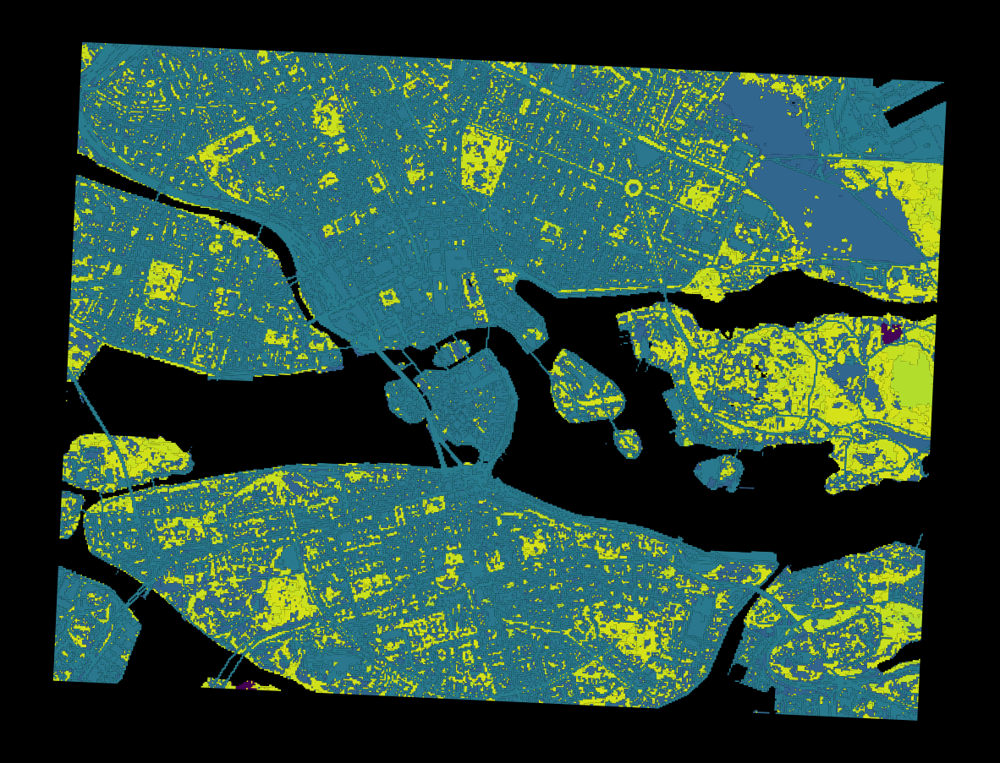

In [ ]:
import matplotlib.colors as colors

# Create a colormap
cmap = plt.get_cmap('viridis')

# Normalize the 'value' column to the range [0, 1]
norm = colors.Normalize(vmin=gdf['value'].min(), vmax=gdf['value'].max())

# Create a new column 'color' that maps 'value' to a color
gdf['color'] = gdf['value'].apply(lambda x: 'black' if x in [61.0, 62.0] else cmap(norm(x)))

fig, ax = plt.subplots(1, 1, figsize=(15, 15))

# Plot the GeoDataFrame using the 'color' column
gdf.plot(color=gdf['color'], ax=ax)

fig.patch.set_facecolor('black') # background
ax.axis('off')
plt.show()

In [ ]:
# Save the values in the 'value' column as a list
value_list = gdf['value'].to_list()
unique_values = sorted(set(value_list))
number_of_land_cover = len(unique_values)

print(unique_values)
print(number_of_land_cover)

[2.0, 3.0, 41.0, 42.0, 51.0, 52.0, 53.0, 61.0, 62.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 125.0]
17


**Land cover values:**

2 = Open wetland

3 = Farm Land

41 = Open area without vegetation

42 = Open area with vegetation

51 = buildings

52 = exploited land - no building or road

53 = paved road

61 = lake or waterway

62 = sea

111-117 = Forest (no wetland)

125 = Forest on wetland

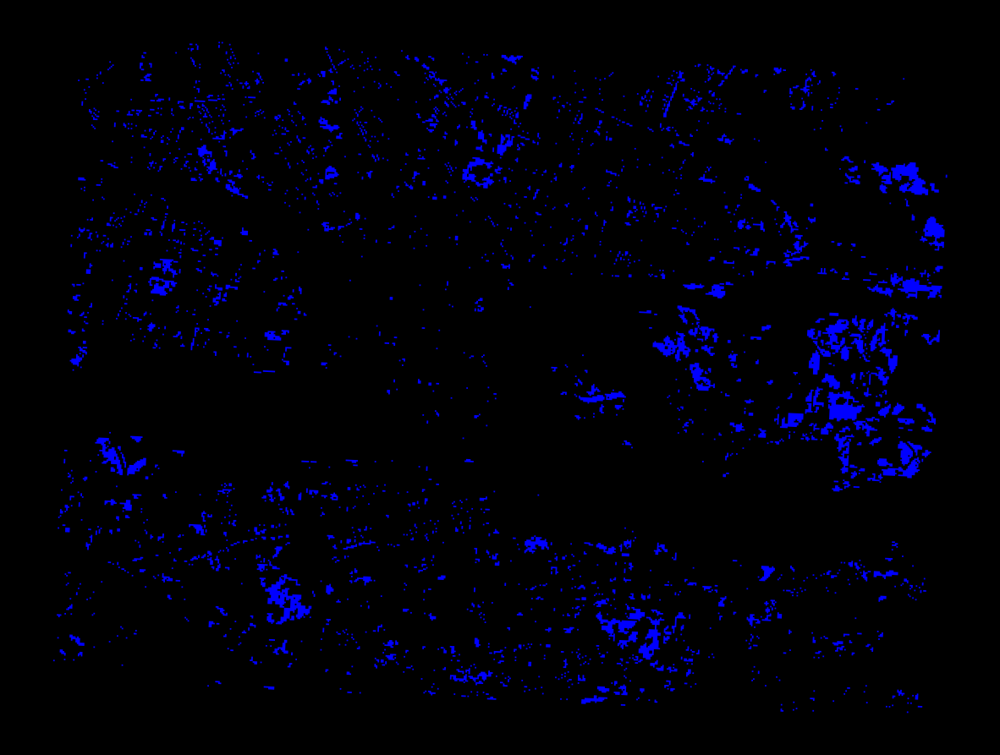

In [ ]:
# Filter the DataFrame
gdf_filtered = gdf[gdf['value'] == 117]

# Plot the filtered DataFrame
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
gdf_filtered.plot(ax=ax, legend=False, color='blue')

fig.patch.set_facecolor('black') # background
ax.axis('off')
plt.show()

In [ ]:
# find 'value' in range 111-117 make them = 117 then assign to gdf
gdf['value'] = gdf['value'].apply(lambda x: 117 if 111 <= x <= 117 else x)

In [ ]:
# Save the values in the 'value' column as a list
value_list = gdf['value'].to_list()
unique_values = sorted(set(value_list))
number_of_land_cover = len(unique_values)

print(unique_values)
print(number_of_land_cover)

[2.0, 3.0, 41.0, 42.0, 51.0, 52.0, 53.0, 61.0, 62.0, 117.0, 125.0]
11


In [ ]:
# Convert nodes to GeoDataFrame with Point geometry
nodes_gdf = gpd.GeoDataFrame(nodes, geometry=gpd.points_from_xy(nodes.x, nodes.y))

# Perform spatial join
joined = gpd.sjoin(nodes_gdf, gdf, how='left', op='intersects')

# Add land_cover attribute to nodes in graph
for node, data in G.nodes(data=True):
    if node in joined.index:
        data['land_cover'] = joined.loc[node, 'value']

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


In [ ]:
# find if land_cover in the node = nan, make them = 0
for node, data in G.nodes(data=True):
  if np.isnan(data['land_cover']):
    data['land_cover'] = 0

# Graph

In [ ]:
print(len(nodes))
# Get Node Elevations as a Dictionary
node_elevations = nx.get_node_attributes(G, 'elevation')

# Identify Nodes with NaN Elevations by ID
nodes_to_remove = [node_id for node_id, elevation in node_elevations.items() if np.isnan(elevation)]

# Remove Nodes by ID
G.remove_nodes_from(nodes_to_remove)

# Update GeoDataFrames (if necessary)
nodes, edges = ox.graph_to_gdfs(G)
print(len(nodes))

In [ ]:
for u, v, data in G.edges(data=True):
    print(f"Edge: {(u, v)}, Data: {data}")

Edge: (119024, 21651762), Data: {'osmid': [35022832, 250434555, 533215515], 'name': 'Pålsundsbacken', 'highway': 'tertiary', 'maxspeed': '50', 'oneway': False, 'reversed': False, 'length': 109.92099999999999, 'lanes': '2', 'geometry': <LINESTRING (672605.639 6579568.411, 672606.978 6579562.528, 672608.213 6579...>, 'grade': 0.066, 'grade_abs': 0.066}
Edge: (119024, 34586358), Data: {'osmid': [5083148, 178313471], 'name': 'Söder Mälarstrand', 'highway': 'tertiary', 'maxspeed': '50', 'oneway': False, 'reversed': True, 'length': 295.59, 'lanes': '2', 'geometry': <LINESTRING (672605.639 6579568.411, 672583.973 6579563.532, 672566.665 6579...>, 'grade': -0.014, 'grade_abs': 0.014}
Edge: (119024, 35123521), Data: {'osmid': [1300, 660569359], 'name': 'Söder Mälarstrand', 'highway': 'tertiary', 'maxspeed': '50', 'oneway': False, 'reversed': False, 'length': 76.768, 'lanes': ['3', '2'], 'geometry': <LINESTRING (672605.639 6579568.411, 672616.107 6579572.846, 672640.698 6579...>, 'grade': -0.041

In [ ]:
for node, data in G.nodes(data=True):
    print(f"Node: {node}, Data: {data}")

Node: 119024, Data: {'y': 6579568.41056667, 'x': 672605.6385385405, 'highway': 'traffic_signals', 'street_count': 3, 'elevation': 7.779296875, 'elevation_scaled': -0.7852758998132703, 'land_cover': 53.0, 'land_cover_0': False, 'land_cover_1': False, 'land_cover_2': False, 'land_cover_3': False, 'land_cover_4': False, 'land_cover_5': True, 'land_cover_6': False, 'land_cover_7': False, 'gdf_order': 0, 'valence': 3, 'lon': 18.033155, 'lat': 59.3195751}
Node: 21651762, Data: {'y': 6579497.984569931, 'x': 672546.5241907551, 'street_count': 3, 'elevation': 14.982421875, 'elevation_scaled': -0.03125911240025614, 'land_cover': 53.0, 'land_cover_0': False, 'land_cover_1': False, 'land_cover_2': False, 'land_cover_3': False, 'land_cover_4': False, 'land_cover_5': True, 'land_cover_6': False, 'land_cover_7': False, 'gdf_order': 546, 'valence': 1, 'lon': 18.0320616, 'lat': 59.3189677}
Node: 34586358, Data: {'y': 6579467.598172809, 'x': 672332.2140691978, 'street_count': 3, 'elevation': 3.750976562

In [ ]:
# extract graph again
nodes, edges = ox.graph_to_gdfs(G)

In [ ]:
nodes

,y,x,highway,street_count,elevation,elevation_scaled,land_cover,geometry
osmid,,,,,,,,
119024,59.319575,18.033155,traffic_signals,3,7.709961,-0.792234,53.0,POINT (18.03316 59.31958)
119039,59.320697,18.045443,NaN,2,3.068359,-1.278303,53.0,POINT (18.04544 59.32070)
119042,59.321137,18.050676,NaN,2,2.626953,-1.324527,53.0,POINT (18.05068 59.32114)
119046,59.324654,18.062138,NaN,3,3.414062,-1.242101,53.0,POINT (18.06214 59.32465)
119052,59.323834,18.064586,NaN,3,2.426758,-1.345492,53.0,POINT (18.06459 59.32383)
...,...,...,...,...,...,...,...,...
11709302271,59.326765,18.042430,NaN,3,3.159180,-1.268792,53.0,POINT (18.04243 59.32676)
11709302295,59.328256,18.031350,NaN,3,3.531250,-1.229829,53.0,POINT (18.03135 59.32826)
11830115094,59.332456,18.077017,NaN,4,2.446289,-1.343446,53.0,POINT (18.07702 59.33246)


In [ ]:
# get the unique land_cover of the graph
unique_land_cover = []
for node, data in G.nodes(data=True):
    if 'land_cover' in data:
        unique_land_cover.append(data['land_cover'])
unique_land_cover = set(unique_land_cover)
print(unique_land_cover)


{0, 41.0, 42.0, 51.0, 52.0, 117.0, 53.0, 62.0}


In [ ]:
# One-hot encoding for land cover
one_hot = pd.get_dummies(nodes['land_cover'])
print(one_hot)

# number of one hot column
num_cols = one_hot.shape[1]
print(num_cols)

             0.0    41.0   42.0   51.0   52.0   53.0   62.0   117.0
osmid                                                              
119024       False  False  False  False  False   True  False  False
119039       False  False  False  False  False   True  False  False
119042       False  False  False  False  False   True  False  False
119046       False  False  False  False  False   True  False  False
119052       False  False  False  False  False   True  False  False
...            ...    ...    ...    ...    ...    ...    ...    ...
11709302271  False  False  False  False  False   True  False  False
11709302295  False  False  False  False  False   True  False  False
11830115094  False  False  False  False  False   True  False  False
11886258547  False  False  False  False  False   True  False  False
11895745719  False  False  False  False  False   True  False  False

[2126 rows x 8 columns]
8


In [ ]:
nodes[["land_cover_"+str(i) for i in range(num_cols)]] = one_hot
nodes

,y,x,highway,street_count,elevation,elevation_scaled,land_cover,land_cover_0,land_cover_1,land_cover_2,land_cover_3,land_cover_4,land_cover_5,land_cover_6,land_cover_7,gdf_order,valence,geometry
osmid,,,,,,,,,,,,,,,,,,
119024,59.319575,18.033155,traffic_signals,3,7.709961,-0.792234,53.0,False,False,False,False,False,True,False,False,0,3,POINT (18.03316 59.31958)
119039,59.320697,18.045443,NaN,2,3.068359,-1.278303,53.0,False,False,False,False,False,True,False,False,1,2,POINT (18.04544 59.32070)
119042,59.321137,18.050676,NaN,2,2.626953,-1.324527,53.0,False,False,False,False,False,True,False,False,2,2,POINT (18.05068 59.32114)
119046,59.324654,18.062138,NaN,3,3.414062,-1.242101,53.0,False,False,False,False,False,True,False,False,3,3,POINT (18.06214 59.32465)
119052,59.323834,18.064586,NaN,3,2.426758,-1.345492,53.0,False,False,False,False,False,True,False,False,4,3,POINT (18.06459 59.32383)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11709302271,59.326765,18.042430,NaN,3,3.159180,-1.268792,53.0,False,False,False,False,False,True,False,False,2121,2,POINT (18.04243 59.32676)
11709302295,59.328256,18.031350,NaN,3,3.531250,-1.229829,53.0,False,False,False,False,False,True,False,False,2122,3,POINT (18.03135 59.32826)
11830115094,59.332456,18.077017,NaN,4,2.446289,-1.343446,53.0,False,False,False,False,False,True,False,False,2123,2,POINT (18.07702 59.33246)


#DGL Graph

In [ ]:
#Set nodes attributes
dic_elevation={}
dic_valence={}
dic_land_cover={}
dic_gdf_order={}

#x and y are already in the graph .. check nx.get_node_attributes(G, "x")

for i,j in enumerate(G.nodes()):      #j is the node id
  #print(i)
  dic_elevation[j]=nodes['elevation_scaled'].iloc[i]
  dic_valence[j]=nodes['valence'].iloc[i]
  dic_land_cover[j]=nodes['land_cover'].iloc[i]

  #also store the original node order for plotting later
  dic_gdf_order[j]= i

#one hot encoded classes

cluster_names=["land_cover_"+str(c) for c in range(num_cols)]
clusters_dictionaries={c:{} for c in cluster_names}
print(clusters_dictionaries)

for i,j in enumerate(G.nodes()):      #j is the node id
  for c in clusters_dictionaries.keys():
    clusters_dictionaries[c][j]=nodes[c].iloc[i]  #first c is the dictionary name in the dict of dicts, second c is the column name in the nodes gfd


for c in clusters_dictionaries.keys():
  nx.set_node_attributes(G,clusters_dictionaries[c],c)


nx.set_node_attributes(G,dic_elevation,'elevation_scaled')
nx.set_node_attributes(G,dic_valence,'valence')
nx.set_node_attributes(G,dic_land_cover,'land_cover')
nx.set_node_attributes(G,dic_gdf_order,'gdf_order')

{'land_cover_0': {}, 'land_cover_1': {}, 'land_cover_2': {}, 'land_cover_3': {}, 'land_cover_4': {}, 'land_cover_5': {}, 'land_cover_6': {}, 'land_cover_7': {}}


In [ ]:
# Set the edge classes as edge attribute
dic_edge_class={}
for i,j in enumerate(G.edges()):      #j is the node id
  dic_edge_class[(j[0],j[1],0)]=edges['class'].iloc[i]#0 is the key in the edge index

nx.set_edge_attributes(G,dic_edge_class,'e_classes')

In [ ]:
labeled_edges=[i for i,j in zip(list(edges.index),edges["class"]) if j != 3]
un_labeled_edges=[i for i,j in zip(list(edges.index),edges["class"]) if j == 3]

print(len(labeled_edges))
print(len(un_labeled_edges))

4324
0


In [ ]:
from sklearn.model_selection import train_test_split

train_edges, test_edges= train_test_split(labeled_edges, random_state=1, test_size=.1) #test
train_edges, validation_edges= train_test_split(train_edges, random_state=1, test_size=.11)      #validation

prediction_edges=un_labeled_edges

print(len(train_edges))
print(len(test_edges))
print(len(validation_edges))
print(len(prediction_edges))

ValueError: With n_samples=0, test_size=0.1 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.